In [38]:
import json
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from pathlib import Path

plt.rcParams.update({'figure.dpi': 130, 'font.size': 11})
LOGS = Path('logs/nerf')


## 1 · Load results

In [39]:
records = []
for p in sorted(LOGS.glob('n*/report.json')):
    r   = json.loads(p.read_text())
    cfg = r['config']
    m   = json.loads((p.parent / 'metrics.json').read_text()) if (p.parent / 'metrics.json').exists() else {}
    records.append({
        'run':            p.parent.name,
        'layers':         cfg['hidden_layers'],
        'neurons':        cfg['hidden_features'],
        'L_freq':         cfg['L_freq'],
        'batch_size':     cfg['batch_size'],
        'n_params':       r['n_params'],
        'best_psnr':      r['best_psnr'],
        'best_loss':      r['best_loss'],
        'epochs_trained': r['epochs_trained'],
        'train_sec':      r['train_sec'],
        'ssim':           m.get('ssim'),
        'lpips':          m.get('lpips'),
    })

df = pd.DataFrame(records).sort_values('run').reset_index(drop=True)
df['train_min']  = (df['train_sec'] / 60).round(1)
df['n_params_k'] = (df['n_params'] / 1e3).round(1)

display(df[['run','layers','neurons','L_freq','n_params_k','best_psnr',
            'ssim','lpips','epochs_trained','train_min']]
        .rename(columns={'n_params_k':'params_k','best_psnr':'PSNR (dB)',
                         'epochs_trained':'epochs','train_min':'time (min)'})
        .to_string(index=False))


'      run  layers  neurons  L_freq  params_k  PSNR (dB)     ssim    lpips  epochs  time (min)\nn6256_f10       6      256      10     361.7  41.269990 0.932065 0.033840     390        51.1\nn8128_f10       8      128      10     132.0  40.768858 0.930309 0.038042     325        27.0\nn8256_f10       8      256      10     493.3  41.323145 0.932459 0.033923     314        53.9\n n8256_f4       8      256       4     474.9  40.867119 0.931311 0.041961     565        96.7\n n8256_f6       8      256       6     481.0  40.988007 0.931400 0.039086     247        42.4\n n8256_f8       8      256       8     487.2  41.206030 0.931834 0.034289     200        34.5\nn8512_f10       8      512      10    1904.1  41.464437 0.933192 0.033656     252       116.9'

## 2 · Load loss curves

In [40]:
def load_loss_curve(run_dir: Path):
    """Load the final loss txt, convert MSE → PSNR, return running-maximum (best-so-far) curve."""
    txts = sorted(run_dir.glob('checkpoints/*losses_final.txt'))
    if not txts:
        return None
    losses = np.loadtxt(txts[-1])
    psnr   = -10 * np.log10(losses + 1e-8)
    return np.maximum.accumulate(psnr)

curves = {}
for p in sorted(LOGS.glob('n*/report.json')):
    name = p.parent.name
    c    = load_loss_curve(p.parent)
    if c is not None:
        curves[name] = c
        print(f'{name}: {len(c):,} steps  final PSNR {c[-1]:.2f} dB')


n6256_f10: 44,070 steps  final PSNR 41.33 dB
n8128_f10: 36,725 steps  final PSNR 40.86 dB
n8256_f10: 35,482 steps  final PSNR 41.38 dB
n8256_f4: 63,845 steps  final PSNR 40.97 dB
n8256_f6: 27,911 steps  final PSNR 41.12 dB
n8256_f8: 22,600 steps  final PSNR 41.26 dB
n8512_f10: 28,476 steps  final PSNR 41.53 dB


## 3 · Frequency ablation  (layers=8 · neurons=256 · L ∈ {4,6,8,10})

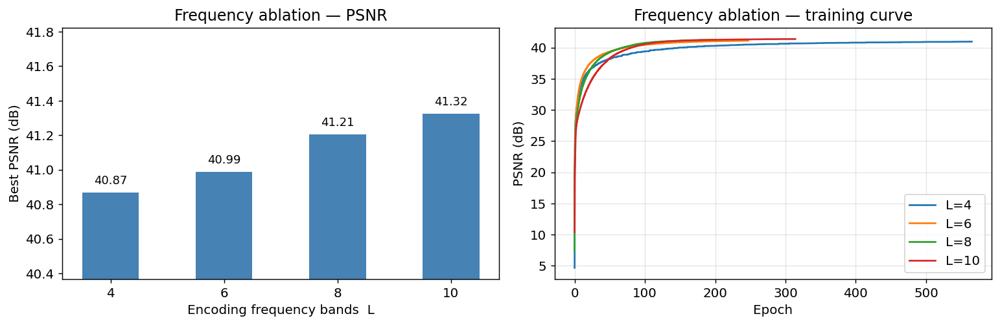

In [41]:
freq = df[(df.layers == 8) & (df.neurons == 256)].sort_values('L_freq')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(freq['L_freq'].astype(str), freq['best_psnr'], color='steelblue', width=0.5)
ax.set_xlabel('Encoding frequency bands  L')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Frequency ablation — PSNR')
ax.set_ylim(freq['best_psnr'].min() - 0.5, freq['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, freq['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in freq.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"L={int(row['L_freq'])}")
ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('Frequency ablation — training curve')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'freq_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 4 · Depth ablation  (layers=4,6,8 · neurons=256 · L=10)

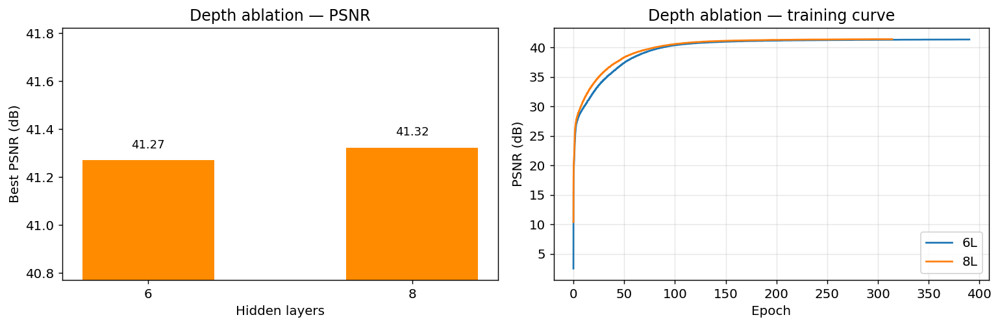

In [42]:
depth = df[(df.neurons == 256) & (df.L_freq == 10)].sort_values('layers')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(depth['layers'].astype(str), depth['best_psnr'], color='darkorange', width=0.5)
ax.set_xlabel('Hidden layers')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Depth ablation — PSNR')
ax.set_ylim(depth['best_psnr'].min() - 0.5, depth['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, depth['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in depth.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"{int(row['layers'])}L")
ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('Depth ablation — training curve')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'depth_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 5 · Width ablation  (layers=8 · neurons=128,256,512 · L=10)

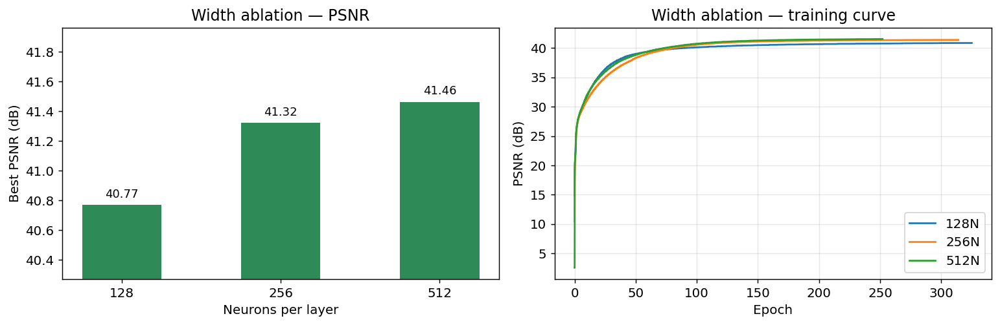

In [43]:
width = df[(df.layers == 8) & (df.L_freq == 10)].sort_values('neurons')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(width['neurons'].astype(str), width['best_psnr'], color='seagreen', width=0.5)
ax.set_xlabel('Neurons per layer')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Width ablation — PSNR')
ax.set_ylim(width['best_psnr'].min() - 0.5, width['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, width['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in width.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"{int(row['neurons'])}N")
ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('Width ablation — training curve')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'width_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 6 · Efficiency — PSNR vs parameters & training time

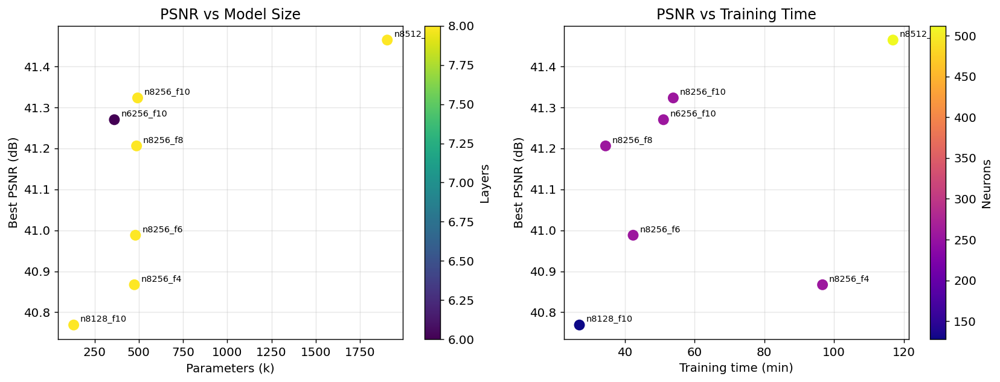

In [44]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ax = axes[0]
sc = ax.scatter(df['n_params_k'], df['best_psnr'], s=80, c=df['layers'], cmap='viridis', zorder=3)
plt.colorbar(sc, ax=ax, label='Layers')
for _, row in df.iterrows():
    ax.annotate(row['run'], (row['n_params_k'], row['best_psnr']),
                textcoords='offset points', xytext=(6, 3), fontsize=8)
ax.set_xlabel('Parameters (k)')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('PSNR vs Model Size')
ax.grid(alpha=0.3)

ax = axes[1]
sc = ax.scatter(df['train_min'], df['best_psnr'], s=80, c=df['neurons'], cmap='plasma', zorder=3)
plt.colorbar(sc, ax=ax, label='Neurons')
for _, row in df.iterrows():
    ax.annotate(row['run'], (row['train_min'], row['best_psnr']),
                textcoords='offset points', xytext=(6, 3), fontsize=8)
ax.set_xlabel('Training time (min)')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('PSNR vs Training Time')
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'efficiency.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 7 · All training curves

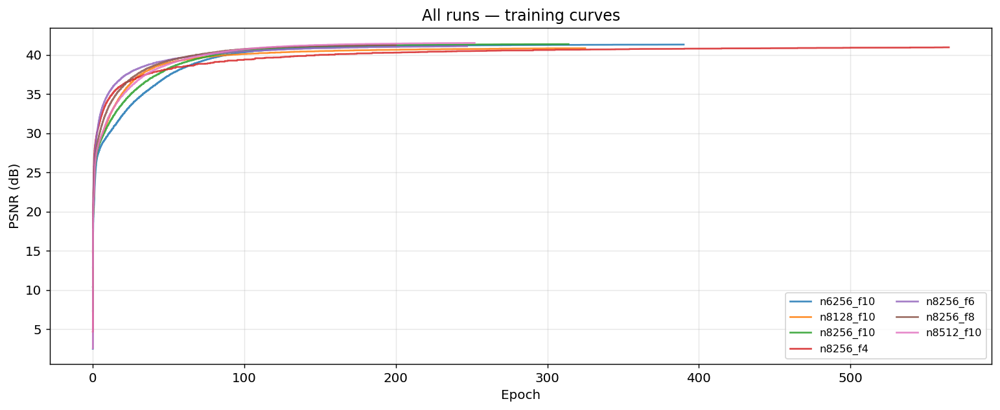

In [45]:
fig, ax = plt.subplots(figsize=(12, 5))
for name, c in sorted(curves.items()):
    row = df[df.run == name]
    if row.empty:
        continue
    ep = row['epochs_trained'].values[0]
    steps_per_ep = len(c) // ep
    epochs = np.arange(len(c)) / max(steps_per_ep, 1)
    ax.plot(epochs, c, label=name, alpha=0.85)

ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('All runs — training curves')
ax.legend(fontsize=9, ncol=2)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'all_curves.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 8 · Summary table + export CSV

In [46]:
has_metrics = df['ssim'].notna().any()
cols    = ['run','layers','neurons','L_freq','n_params','best_psnr','best_loss','epochs_trained','batch_size']
renames = {'best_psnr':'PSNR (dB)', 'best_loss':'MSE', 'epochs_trained':'epochs', 'L_freq':'L'}
if has_metrics:
    cols = cols[:6] + ['ssim','lpips'] + cols[6:]
    renames.update({'ssim':'SSIM ↑', 'lpips':'LPIPS ↓'})

summary = df[cols].copy()
summary['best_psnr'] = summary['best_psnr'].round(2)
summary['best_loss'] = summary['best_loss'].map('{:.2e}'.format)
if has_metrics:
    summary['ssim']  = summary['ssim'].map(lambda v: f'{v:.4f}' if v is not None else 'N/A')
    summary['lpips'] = summary['lpips'].map(lambda v: f'{v:.4f}' if v is not None else 'N/A')
summary = summary.rename(columns=renames)
summary.to_csv(LOGS / 'ablation' / 'results.csv', index=False)
print('Saved → logs/nerf/ablation/results.csv')
display(summary)


Saved → logs/nerf/ablation/results.csv


,run,layers,neurons,L,n_params,PSNR (dB),SSIM ↑,LPIPS ↓,MSE,epochs,batch_size
0,n6256_f10,6,256,10,361729,41.27,0.9321,0.0338,7.46e-05,390,1048576
1,n8128_f10,8,128,10,131969,40.77,0.9303,0.0380,8.38e-05,325,1048576
2,n8256_f10,8,256,10,493313,41.32,0.9325,0.0339,7.37e-05,314,1048576
3,n8256_f4,8,256,4,474881,40.87,0.9313,0.0420,8.19e-05,565,1048576
4,n8256_f6,8,256,6,481025,40.99,0.9314,0.0391,7.96e-05,247,1048576
5,n8256_f8,8,256,8,487169,41.21,0.9318,0.0343,7.57e-05,200,1048576
6,n8512_f10,8,512,10,1904129,41.46,0.9332,0.0337,7.14e-05,252,1048576


In [47]:
import sys, torch, torch.nn.functional as F
sys.path.insert(0, str(Path('.')))
from src.nerf import NeRFModel
from skimage.metrics import structural_similarity
import lpips as lpips_lib
import tifffile

INPUT       = '10-2900-control-cell-05.oif-C0.v3dpbd.tif'
INFER_BATCH = 2**20
SLICE_IDXS  = [20, 40, 60, 80]
LPIPS_SZ    = 256

vol_raw = tifffile.imread(INPUT).astype('float32')
vmin_v, vmax_v = vol_raw.min(), vol_raw.max()
gt_vol  = (vol_raw - vmin_v) / (vmax_v - vmin_v)
D, H, W = gt_vol.shape
slice_idxs = [max(0, min(D-1, z)) for z in SLICE_IDXS]

axes_g   = [np.linspace(-1, 1, s, dtype='float32') for s in (D, H, W)]
coords_t = torch.from_numpy(
    np.stack([g.flatten() for g in np.meshgrid(*axes_g, indexing='ij')], axis=-1))

lpips_fn = lpips_lib.LPIPS(net='alex').cuda()
lpips_fn.eval()

def reconstruct(model):
    model.cuda().eval()
    parts = []
    with torch.no_grad():
        for i in range(0, len(coords_t), INFER_BATCH):
            parts.append(model(coords_t[i:i+INFER_BATCH].cuda()).squeeze(-1).cpu())
    return torch.cat(parts).numpy().reshape(D, H, W)

def find_best_ckpt(run_dir):
    bests = sorted(run_dir.glob('checkpoints/*_best.pth'))
    return bests[-1] if bests else None

def slice_metrics(gt_sl, rc_sl):
    ssim_val = structural_similarity(gt_sl, rc_sl, data_range=1.0)
    gt_t = torch.from_numpy(gt_sl)[None, None].expand(1, 3, -1, -1)
    rc_t = torch.from_numpy(rc_sl)[None, None].expand(1, 3, -1, -1)
    gt_t = F.interpolate(gt_t, LPIPS_SZ, mode='bilinear', align_corners=False)
    rc_t = F.interpolate(rc_t, LPIPS_SZ, mode='bilinear', align_corners=False)
    with torch.no_grad():
        lp_val = lpips_fn(gt_t.cuda()*2-1, rc_t.cuda()*2-1).item()
    return ssim_val, lp_val

print(f'Volume {D}×{H}×{W}   slices at z={slice_idxs}')


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth
Volume 113×1024×1024   slices at z=[20, 40, 60, 80]


/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, ma

## 10 · SSIM & LPIPS

In [48]:
# lpips_fn, gt_vol, D, reconstruct, find_best_ckpt defined in section 9 setup
N_LPIPS_SLICES = 20
LPIPS_SZ       = 256

metrics_rows = []
for _, row in df.iterrows():
    run_dir      = LOGS / row['run']
    metrics_path = run_dir / 'metrics.json'

    if metrics_path.exists():
        m = json.loads(metrics_path.read_text())
        print(f"{row['run']}: cached   SSIM={m['ssim']:.4f}  LPIPS={m['lpips']:.4f}")
        metrics_rows.append({'run': row['run'], **m})
        continue

    ckpt = find_best_ckpt(run_dir)
    if ckpt is None:
        print(f"{row['run']}: no checkpoint — skipping")
        continue

    model = NeRFModel(
        in_features=3,
        hidden_features=int(row['neurons']),
        hidden_layers=int(row['layers']),
        out_features=1,
        L_freq=int(row['L_freq']),
    )
    sd = torch.load(ckpt, weights_only=True)
    sd = {k.replace('_orig_mod.', ''): v for k, v in sd.items()}
    model.load_state_dict(sd)
    recon = reconstruct(model)
    torch.cuda.empty_cache()

    ssim_val = float(np.mean([
        structural_similarity(gt_vol[z], recon[z], data_range=1.0)
        for z in range(D)
    ]))

    z_idxs  = np.linspace(0, D - 1, N_LPIPS_SLICES, dtype=int)
    lp_vals = []
    for z in z_idxs:
        gt_t = torch.from_numpy(gt_vol[z])[None, None].expand(1, 3, -1, -1)
        rc_t = torch.from_numpy(recon[z])[None, None].expand(1, 3, -1, -1)
        gt_t = F.interpolate(gt_t, LPIPS_SZ, mode='bilinear', align_corners=False)
        rc_t = F.interpolate(rc_t, LPIPS_SZ, mode='bilinear', align_corners=False)
        with torch.no_grad():
            lp_vals.append(lpips_fn(gt_t.cuda() * 2 - 1, rc_t.cuda() * 2 - 1).item())
    lpips_val = float(np.mean(lp_vals))

    m = {'ssim': ssim_val, 'lpips': lpips_val}
    metrics_path.write_text(json.dumps(m, indent=2))
    print(f"{row['run']}: computed  SSIM={ssim_val:.4f}  LPIPS={lpips_val:.4f}  → saved")
    metrics_rows.append({'run': row['run'], **m})
    del recon

mdf = pd.DataFrame(metrics_rows)
for col in ('ssim', 'lpips'):
    df[col] = df['run'].map(mdf.set_index('run')[col])


n6256_f10: cached   SSIM=0.9321  LPIPS=0.0338
n8128_f10: cached   SSIM=0.9303  LPIPS=0.0380
n8256_f10: cached   SSIM=0.9325  LPIPS=0.0339
n8256_f4: cached   SSIM=0.9313  LPIPS=0.0420
n8256_f6: cached   SSIM=0.9314  LPIPS=0.0391
n8256_f8: cached   SSIM=0.9318  LPIPS=0.0343
n8512_f10: cached   SSIM=0.9332  LPIPS=0.0337


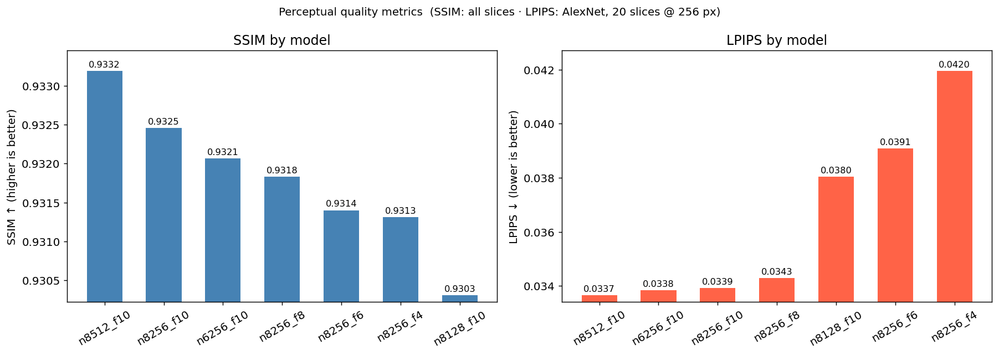

Saved → logs/nerf/ablation/ssim_lpips.pdf


In [49]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, col, label, color, ascending in [
    (axes[0], 'ssim',  'SSIM ↑ (higher is better)',  'steelblue', False),
    (axes[1], 'lpips', 'LPIPS ↓ (lower is better)', 'tomato',    True),
]:
    vals = df[col].dropna()
    if vals.empty:
        ax.set_title(f'{col.upper()} — no data'); continue
    ordered = df.sort_values(col, ascending=ascending).reset_index(drop=True)
    bars = ax.bar(ordered['run'], ordered[col], color=color, width=0.6)
    ax.set_ylabel(label)
    ax.set_title(f'{col.upper()} by model')
    ax.tick_params(axis='x', rotation=30)
    pad = (ordered[col].max() - ordered[col].min()) * 0.03 + 1e-6
    ax.set_ylim(ordered[col].min() - pad, ordered[col].max() + pad * 3)
    for bar, v in zip(bars, ordered[col]):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + pad * 0.3,
                f'{v:.4f}', ha='center', va='bottom', fontsize=9)

plt.suptitle('Perceptual quality metrics  (SSIM: all slices · LPIPS: AlexNet, 20 slices @ 256 px)',
             fontsize=11)
plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'ssim_lpips.pdf', dpi=600, bbox_inches='tight')
plt.show()
print('Saved → logs/nerf/ablation/ssim_lpips.pdf')


## 9 · Volume reconstruction — GT / Recon / Diff  (slices 20 · 40 · 60 · 80)

Processing run n6256_f10...


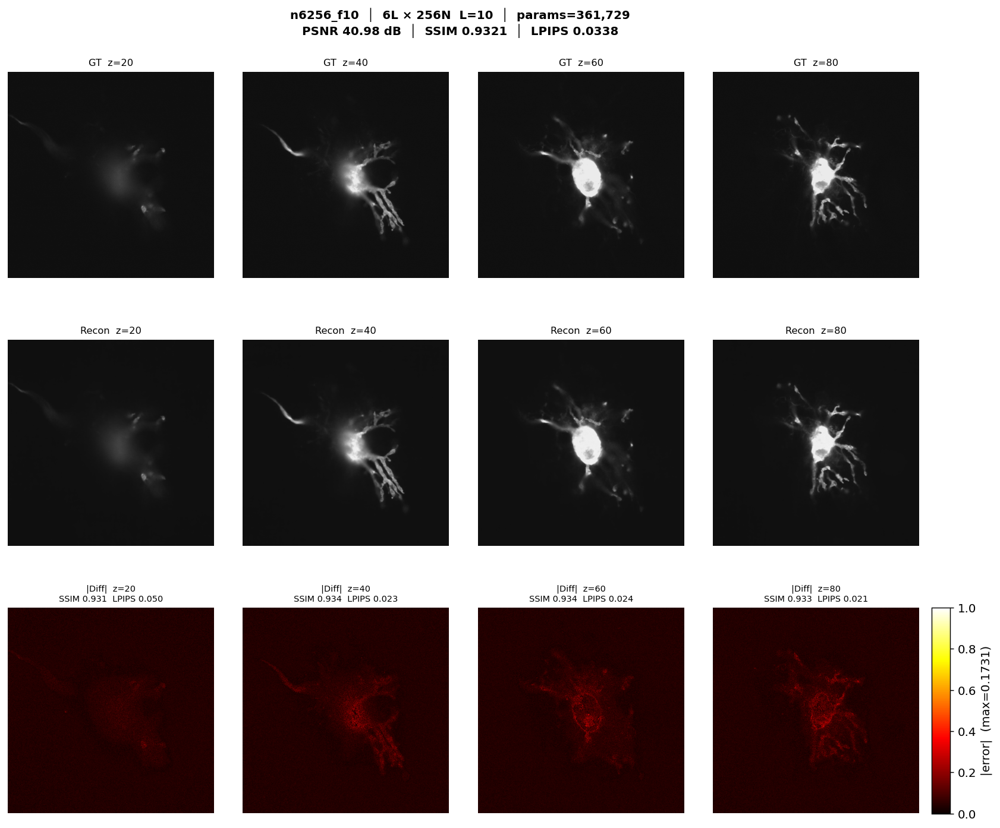

Saved → logs/nerf/ablation/recon_n6256_f10.pdf
Processing run n8128_f10...


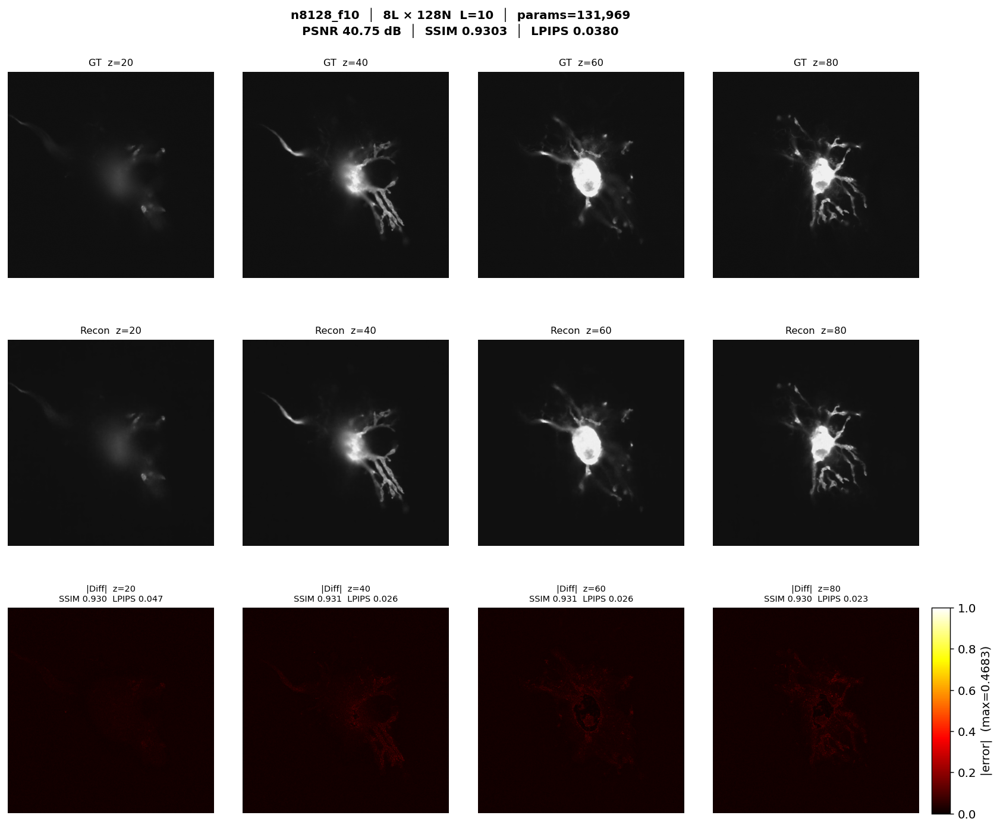

Saved → logs/nerf/ablation/recon_n8128_f10.pdf
Processing run n8256_f10...


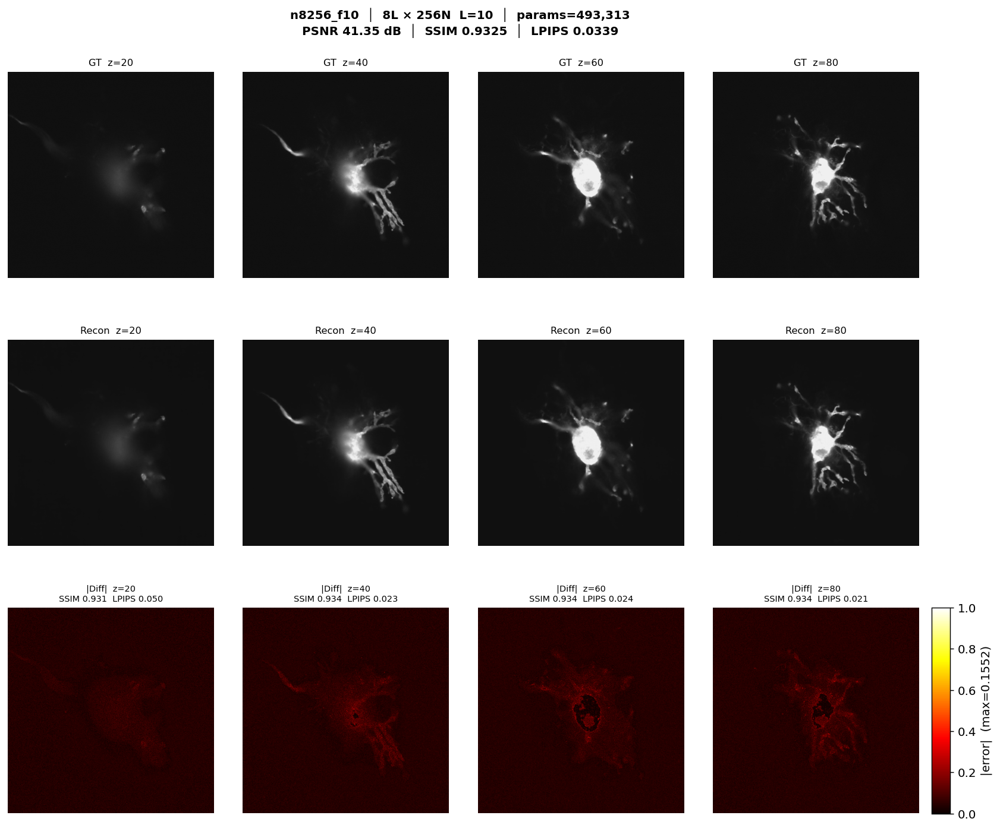

Saved → logs/nerf/ablation/recon_n8256_f10.pdf
Processing run n8256_f4...


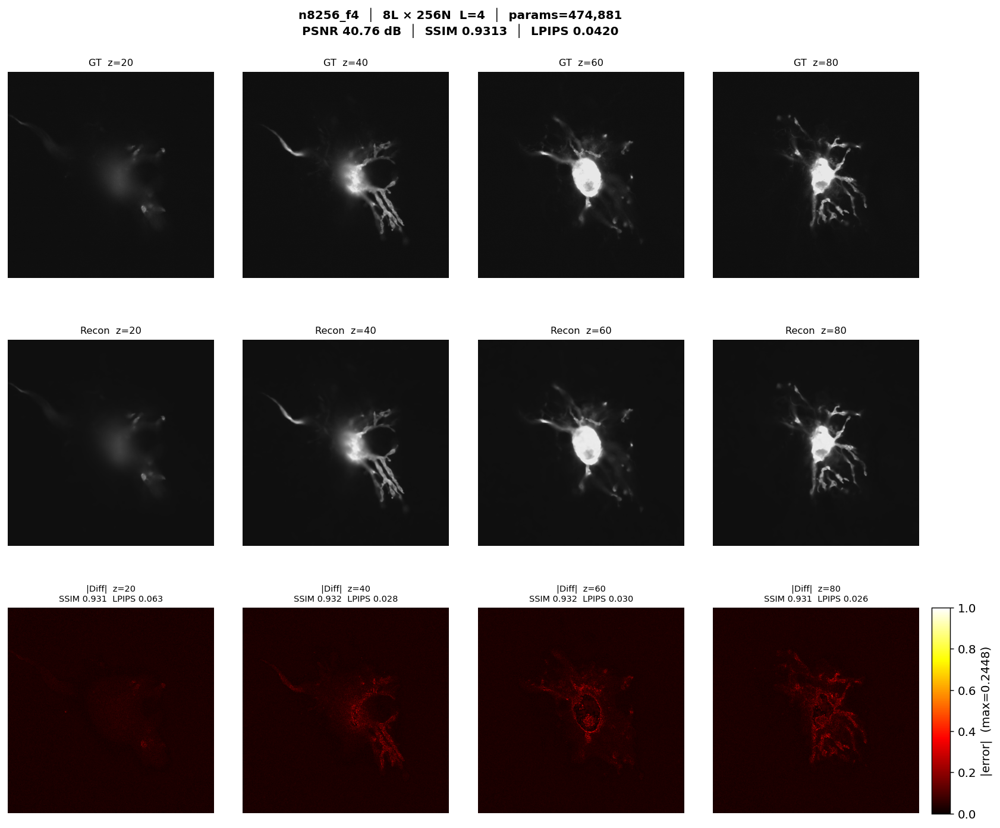

Saved → logs/nerf/ablation/recon_n8256_f4.pdf
Processing run n8256_f6...


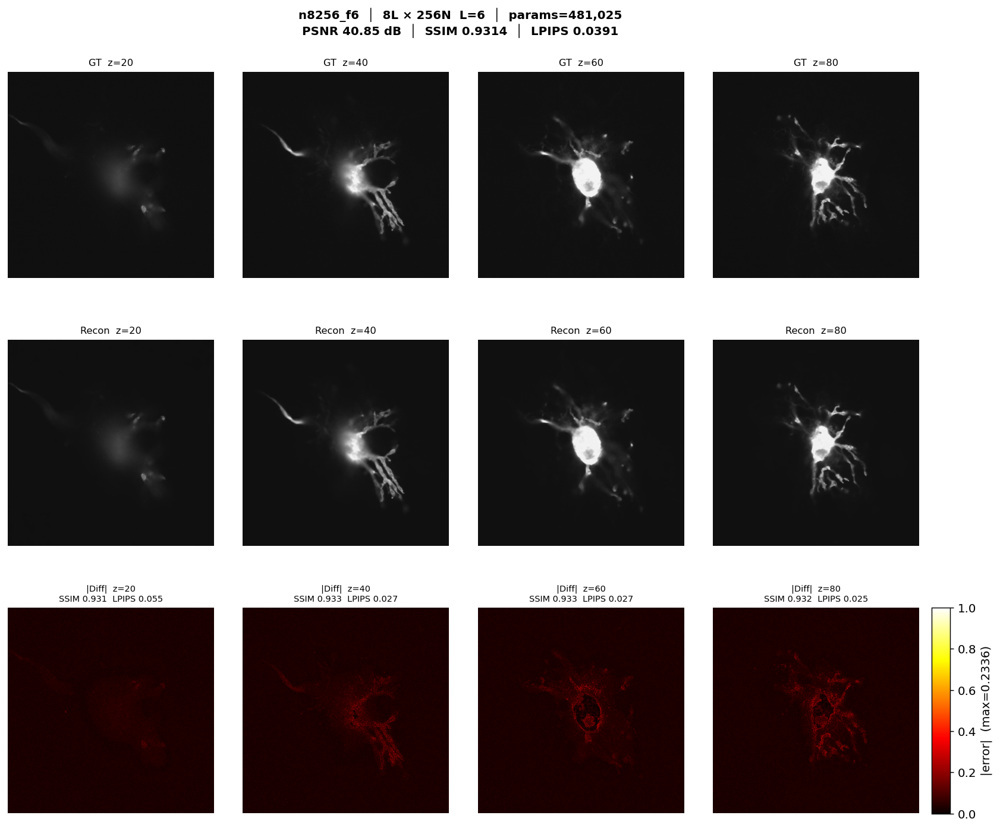

Saved → logs/nerf/ablation/recon_n8256_f6.pdf
Processing run n8256_f8...


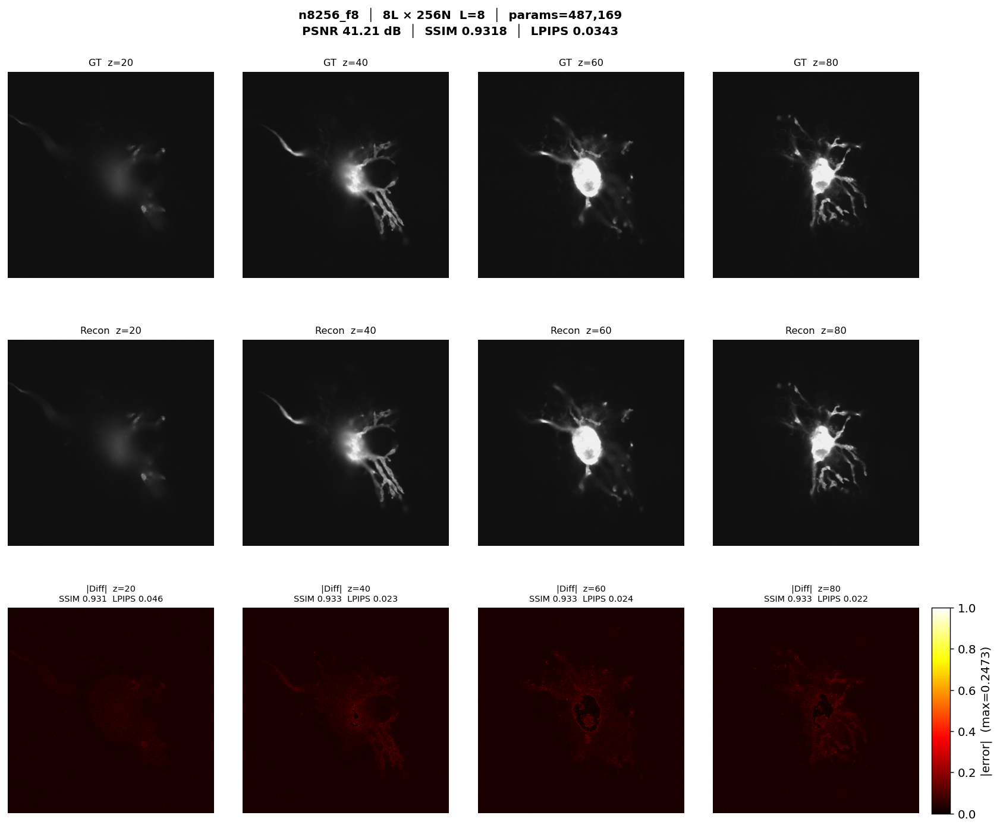

Saved → logs/nerf/ablation/recon_n8256_f8.pdf
Processing run n8512_f10...


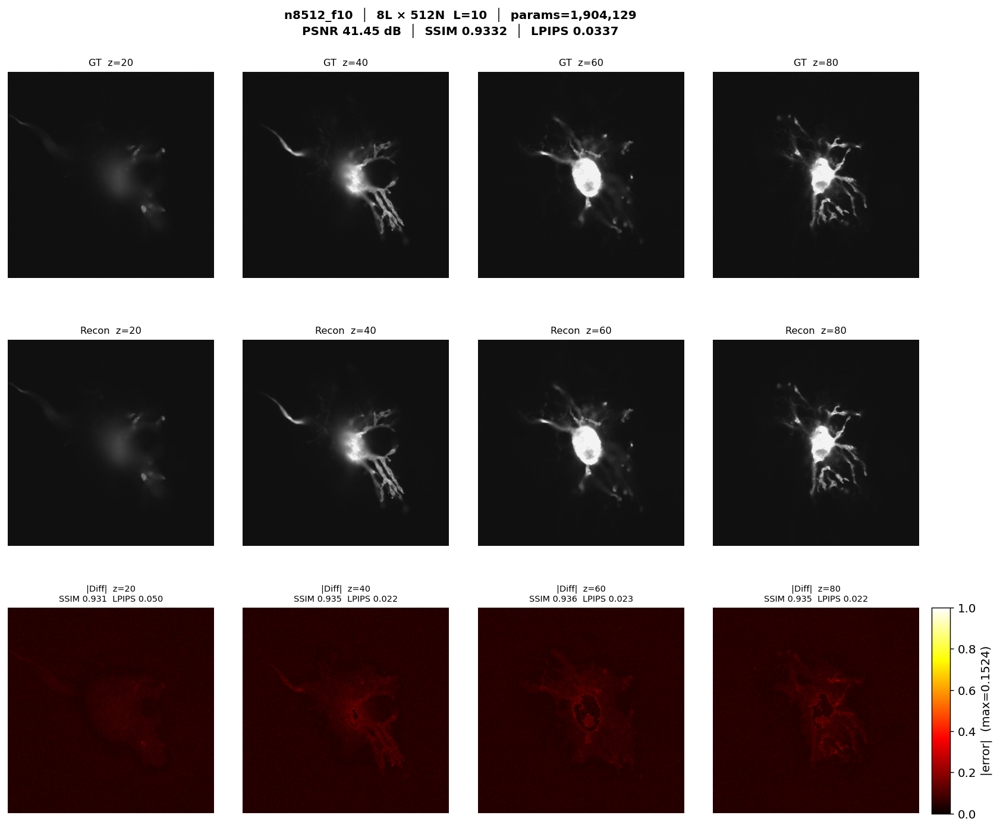

Saved → logs/nerf/ablation/recon_n8512_f10.pdf


In [50]:
for _, row in df.iterrows():
    print(f"Processing run {row['run']}...")
    run_dir = LOGS / row['run']
    ckpt    = find_best_ckpt(run_dir)
    if ckpt is None:
        print(f"{row['run']}: no checkpoint, skipping")
        continue

    model = NeRFModel(
        in_features=3,
        hidden_features=int(row['neurons']),
        hidden_layers=int(row['layers']),
        out_features=1,
        L_freq=int(row['L_freq']),
    )
    sd = torch.load(ckpt, weights_only=True)
    sd = {k.replace('_orig_mod.', ''): v for k, v in sd.items()}
    model.load_state_dict(sd)
    recon = reconstruct(model)
    diff  = np.abs(recon - gt_vol)
    psnr_full = float(-10 * np.log10(((recon - gt_vol)**2).mean() + 1e-8))

    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    fig.subplots_adjust(top=0.91, right=0.88, hspace=0.30, wspace=0.03)
    ssim_s  = f"{float(row['ssim']):.4f}"  if row['ssim']  is not None else 'N/A'
    lpips_s = f"{float(row['lpips']):.4f}" if row['lpips'] is not None else 'N/A'
    fig.suptitle(
        f"{row['run']}  │  {int(row['layers'])}L × {int(row['neurons'])}N  "
        f"L={int(row['L_freq'])}  │  params={int(row['n_params']):,}\n"
        f"PSNR {psnr_full:.2f} dB  │  SSIM {ssim_s}  │  LPIPS {lpips_s}",
        fontsize=11, fontweight='bold'
    )

    gr_min  = min(gt_vol.min(), recon.min())
    gr_max  = max(gt_vol.max(), recon.max())
    diff_max = diff.max() + 1e-8

    for col, z in enumerate(slice_idxs):
        axes[0, col].imshow(gt_vol[z], cmap='gray', vmin=gr_min, vmax=gr_max)
        axes[0, col].set_title(f'GT  z={z}', fontsize=9)

        axes[1, col].imshow(recon[z], cmap='gray', vmin=gr_min, vmax=gr_max)
        axes[1, col].set_title(f'Recon  z={z}', fontsize=9)

        im = axes[2, col].imshow(diff[z] / diff_max, cmap='hot', vmin=0, vmax=1)
        s, lp = slice_metrics(gt_vol[z], recon[z])
        axes[2, col].set_title(f'|Diff|  z={z}\nSSIM {s:.3f}  LPIPS {lp:.3f}', fontsize=8)

    for ax in axes.flat:
        ax.axis('off')

    fig.canvas.draw()
    p0 = axes[2, 0].get_position()
    p1 = axes[2, -1].get_position()
    cbar_ax = fig.add_axes([p1.x1 + 0.01, p0.y0, 0.015, p0.y1 - p0.y0])
    fig.colorbar(im, cax=cbar_ax, label=f'|error|  (max={diff_max:.4f})')

    out = LOGS / 'ablation' / f"recon_{row['run']}.pdf"
    plt.savefig(out, dpi=600, bbox_inches='tight')
    plt.show()
    print(f'Saved → {out}')
    torch.cuda.empty_cache()


## 9b · Maximum Intensity Projection (MIP) — XY · XZ · ZY

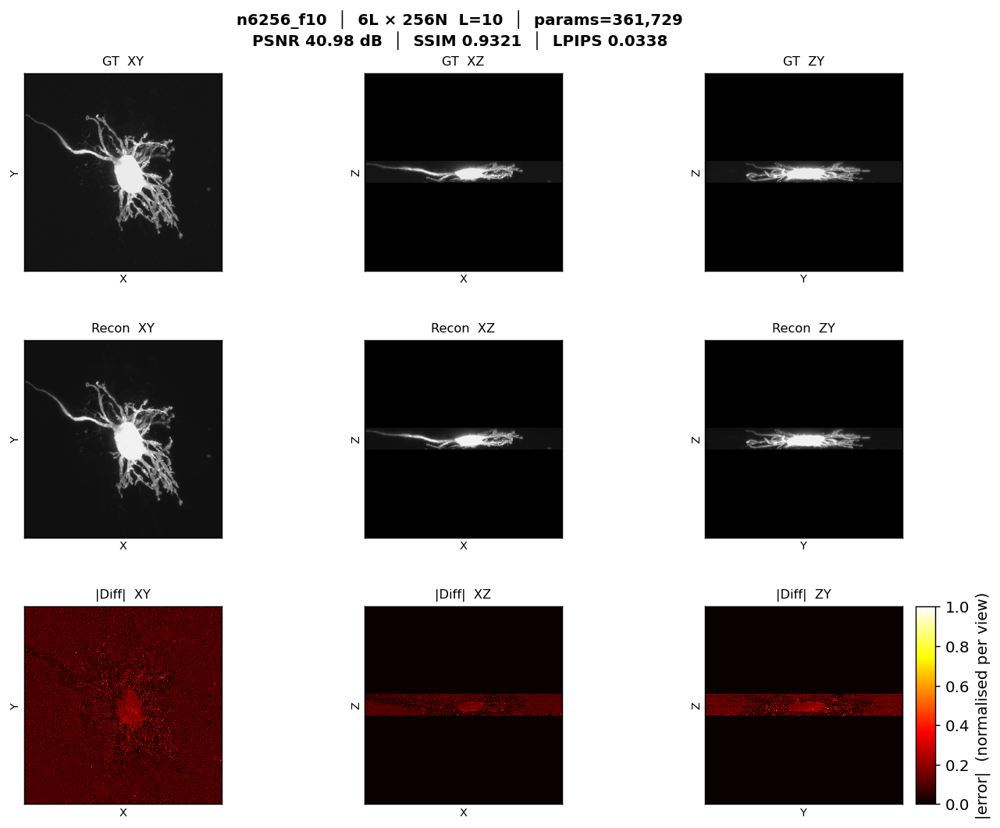

Saved → logs/nerf/ablation/mip_n6256_f10.pdf


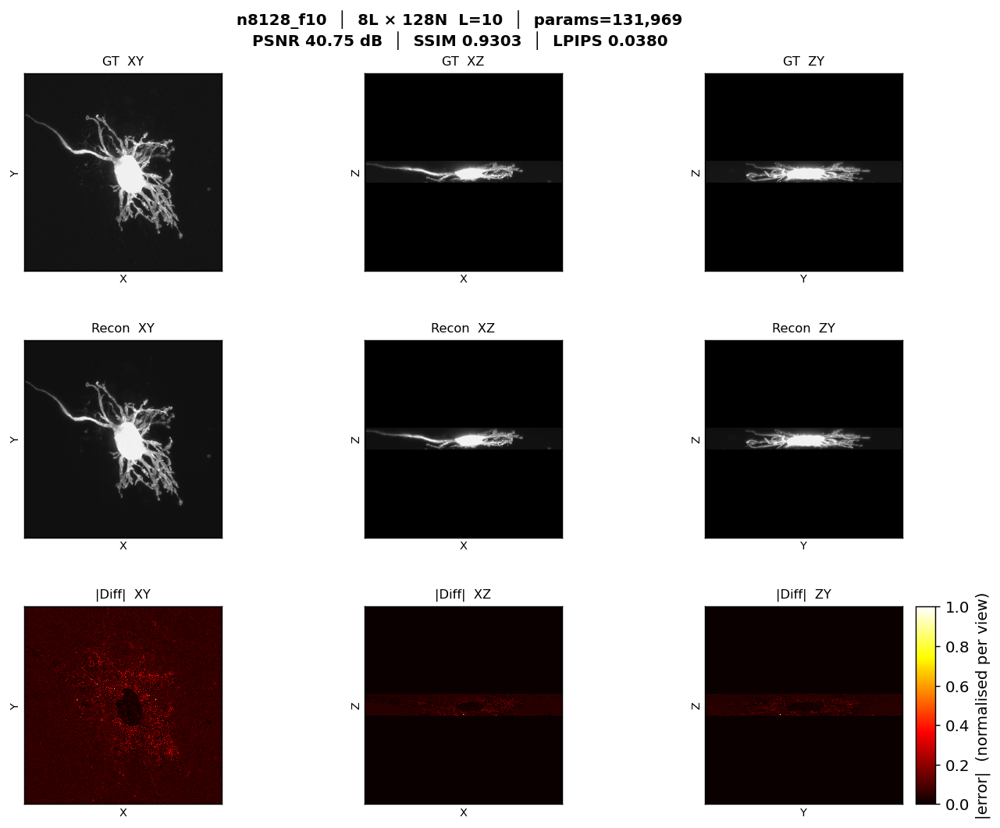

Saved → logs/nerf/ablation/mip_n8128_f10.pdf


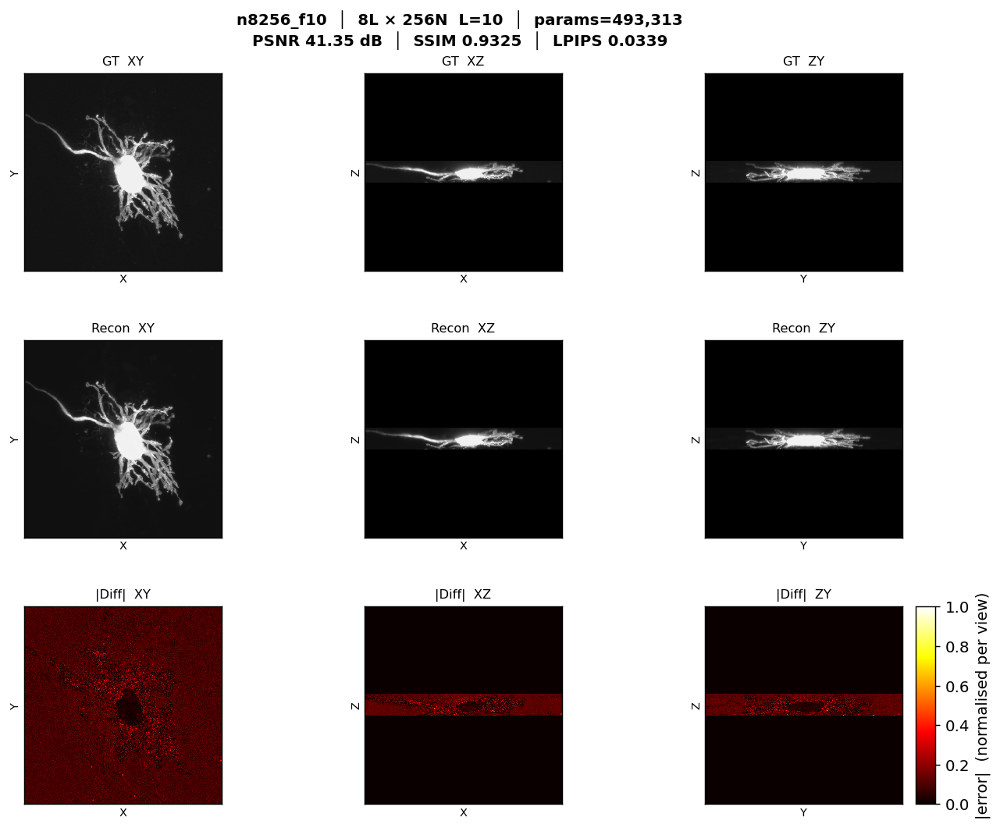

Saved → logs/nerf/ablation/mip_n8256_f10.pdf


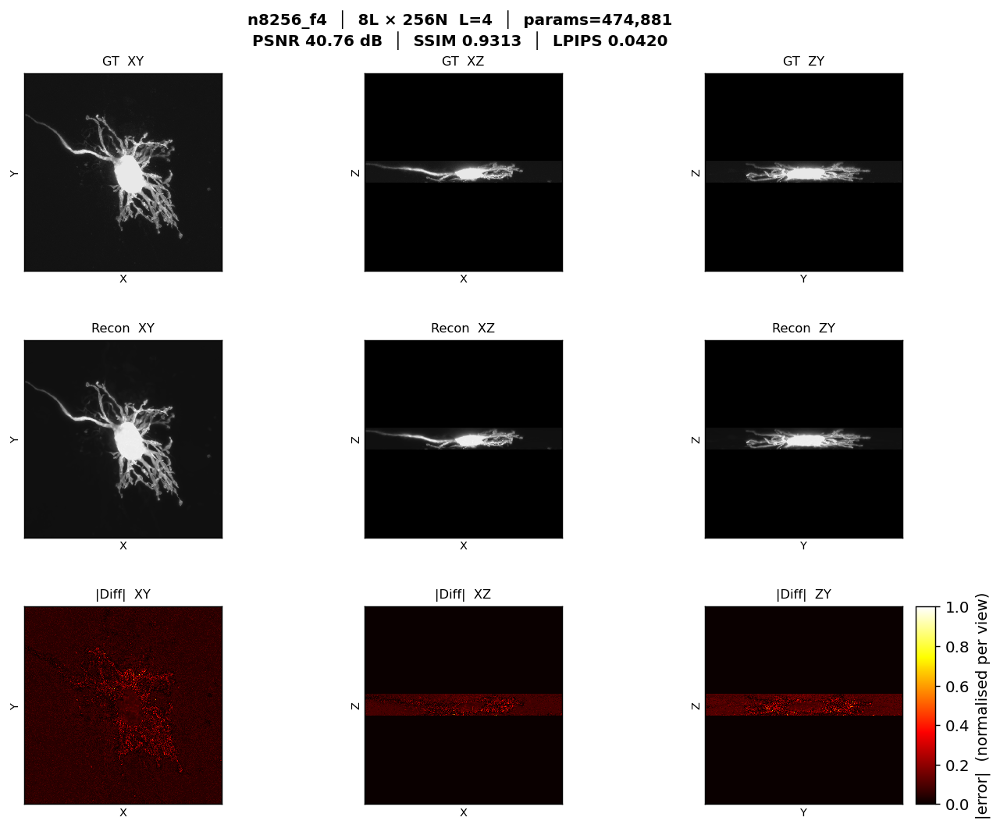

Saved → logs/nerf/ablation/mip_n8256_f4.pdf


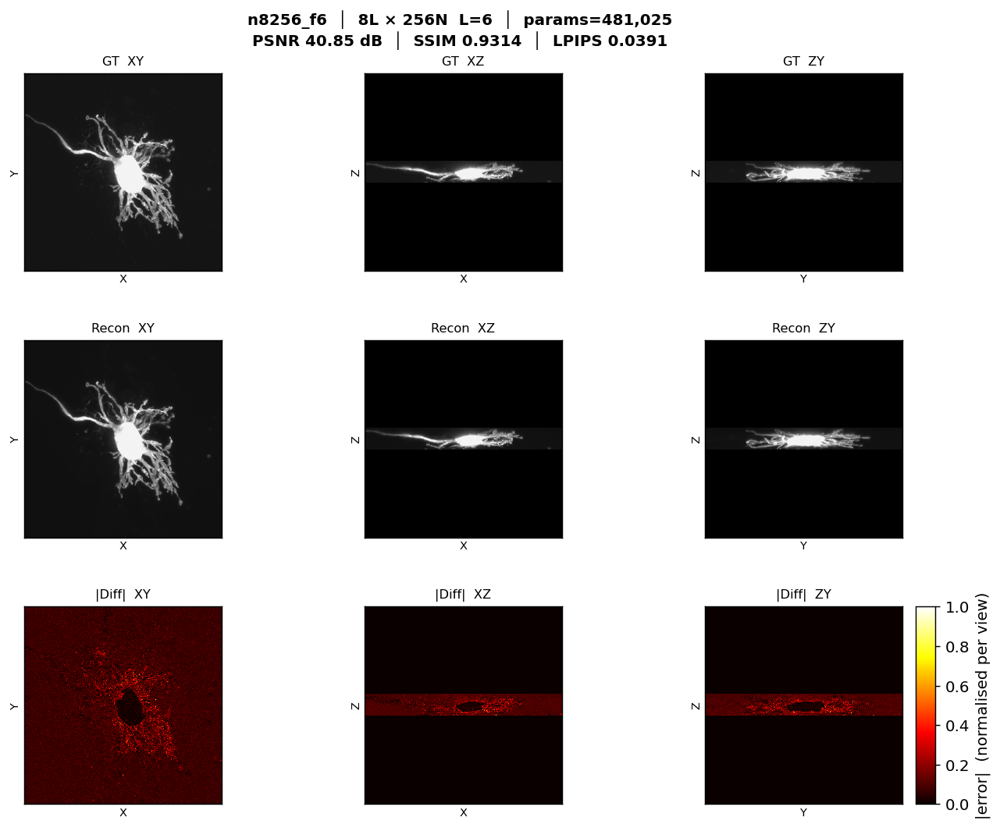

Saved → logs/nerf/ablation/mip_n8256_f6.pdf


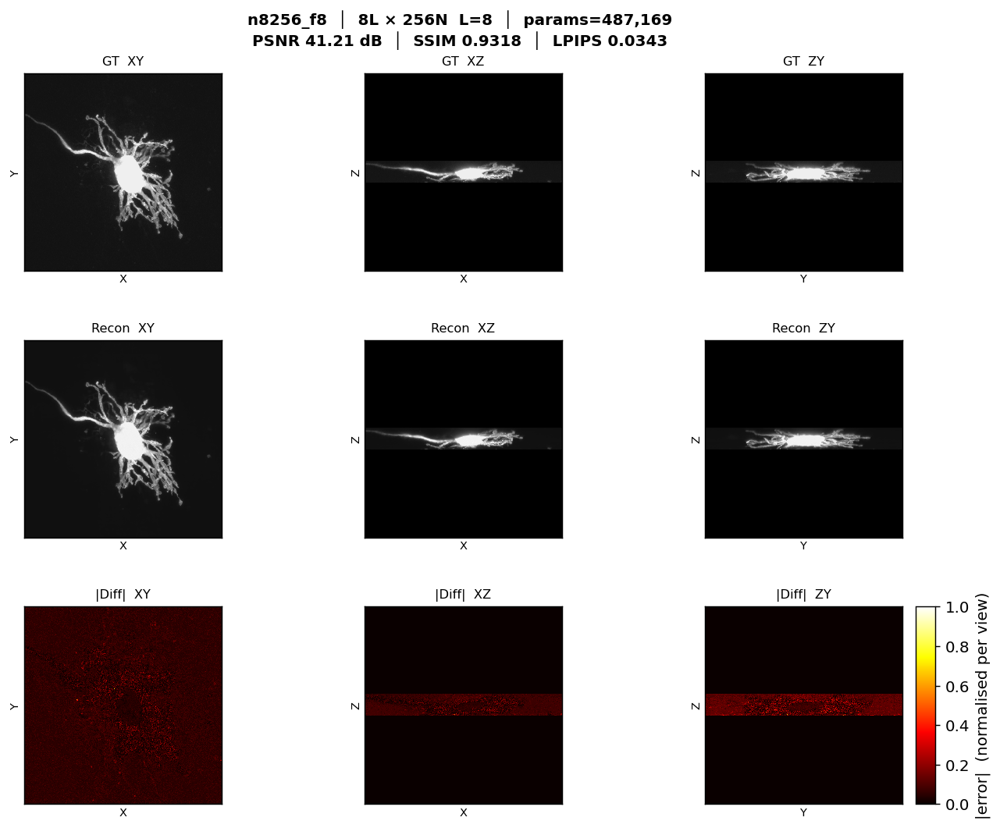

Saved → logs/nerf/ablation/mip_n8256_f8.pdf


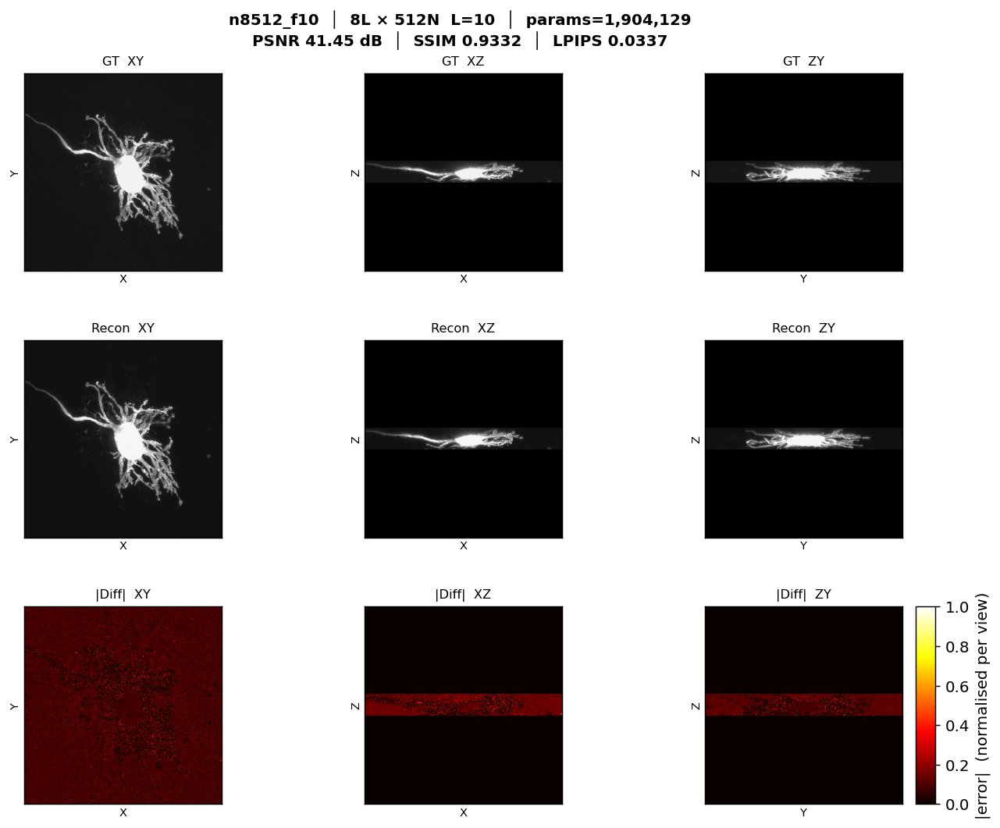

Saved → logs/nerf/ablation/mip_n8512_f10.pdf


In [51]:
def pad_square(img, size=1024, fill=0.0):
    """Centre-pad img to size×size without stretching."""
    h, w = img.shape
    out  = np.full((size, size), fill, dtype=np.float32)
    y0   = (size - h) // 2
    x0   = (size - w) // 2
    out[y0:y0+h, x0:x0+w] = img
    return out

for _, row in df.iterrows():
    run_dir = LOGS / row['run']
    ckpt    = find_best_ckpt(run_dir)
    if ckpt is None:
        print(f"{row['run']}: no checkpoint, skipping")
        continue

    model = NeRFModel(
        in_features=3,
        hidden_features=int(row['neurons']),
        hidden_layers=int(row['layers']),
        out_features=1,
        L_freq=int(row['L_freq']),
    )
    sd = torch.load(ckpt, weights_only=True)
    sd = {k.replace('_orig_mod.', ''): v for k, v in sd.items()}
    model.load_state_dict(sd)
    recon = reconstruct(model)
    psnr_full = float(-10 * np.log10(((recon - gt_vol)**2).mean() + 1e-8))

    views = [
        ('XY', 'X', 'Y', np.max(gt_vol, axis=0), np.max(recon, axis=0)),
        ('XZ', 'X', 'Z', np.max(gt_vol, axis=1), np.max(recon, axis=1)),
        ('ZY', 'Y', 'Z', np.max(gt_vol, axis=2), np.max(recon, axis=2)),
    ]

    fig, axes = plt.subplots(3, 3, figsize=(13, 9))
    fig.subplots_adjust(top=0.91, right=0.88, hspace=0.35, wspace=0.08)
    ssim_s  = f"{float(row['ssim']):.4f}"  if row['ssim']  is not None else 'N/A'
    lpips_s = f"{float(row['lpips']):.4f}" if row['lpips'] is not None else 'N/A'
    fig.suptitle(
        f"{row['run']}  │  {int(row['layers'])}L × {int(row['neurons'])}N  "
        f"L={int(row['L_freq'])}  │  params={int(row['n_params']):,}\n"
        f"PSNR {psnr_full:.2f} dB  │  SSIM {ssim_s}  │  LPIPS {lpips_s}",
        fontsize=11, fontweight='bold'
    )

    vmin = min(gt_vol.min(), recon.min())
    vmax = max(gt_vol.max(), recon.max())

    for col, (label, xlabel, ylabel, gt_mip, rc_mip) in enumerate(views):
        diff_mip = np.abs(gt_mip - rc_mip)
        diff_max = diff_mip.max() + 1e-8

        gt_sq   = pad_square(gt_mip)
        rc_sq   = pad_square(rc_mip)
        diff_sq = pad_square(diff_mip / diff_max)

        for row_idx, (img, cmap, vlo, vhi, title) in enumerate([
            (gt_sq,   'gray', vmin, vmax, f'GT  {label}'),
            (rc_sq,   'gray', vmin, vmax, f'Recon  {label}'),
            (diff_sq, 'hot',  0,    1,    f'|Diff|  {label}'),
        ]):
            ax = axes[row_idx, col]
            im_obj = ax.imshow(img, cmap=cmap, vmin=vlo, vmax=vhi,
                               aspect='equal', interpolation='nearest')
            ax.set_title(title, fontsize=9)
            ax.set_xlabel(xlabel, fontsize=8, labelpad=2)
            ax.set_ylabel(ylabel, fontsize=8, labelpad=2)
            ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
            if row_idx == 2:
                im = im_obj

    fig.canvas.draw()
    p0 = axes[2, 0].get_position()
    p1 = axes[2, -1].get_position()
    cbar_ax = fig.add_axes([p1.x1 + 0.01, p0.y0, 0.015, p0.y1 - p0.y0])
    fig.colorbar(im, cax=cbar_ax, label='|error|  (normalised per view)')

    out = LOGS / 'ablation' / f"mip_{row['run']}.pdf"
    plt.savefig(out, dpi=600, bbox_inches='tight')
    plt.show()
    print(f'Saved → {out}')
    torch.cuda.empty_cache()
